In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from keras import Sequential

from keras.preprocessing.image import ImageDataGenerator # Data Augmentation package
from keras.utils import img_to_array,array_to_img,load_img

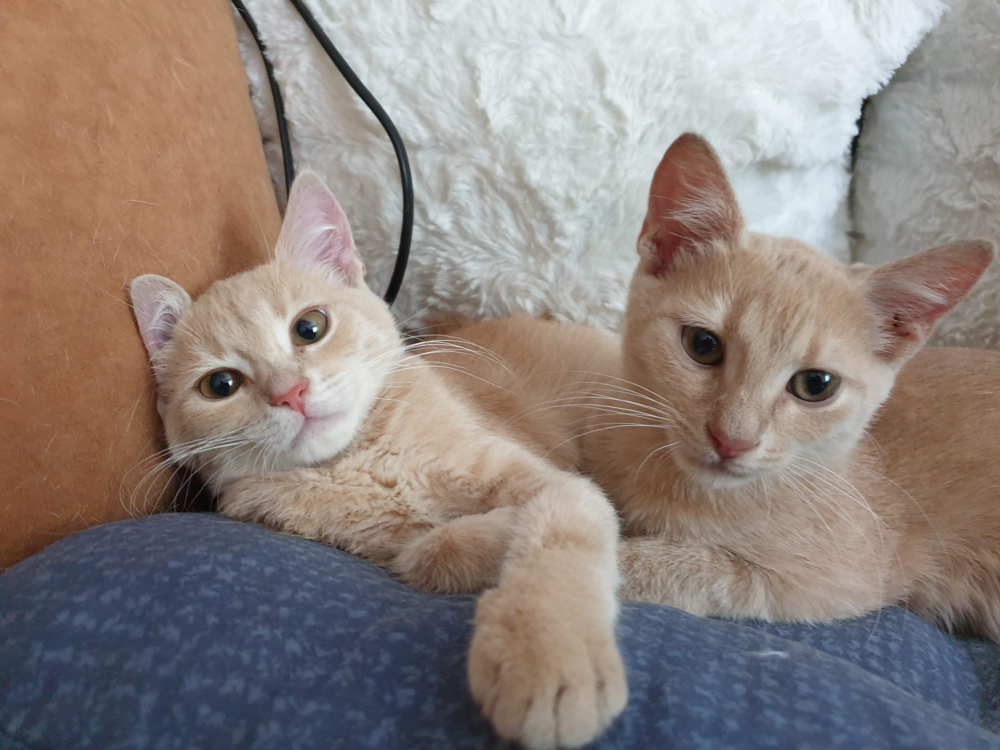

In [6]:
# Load the image

image_file ='/content/cat.jpeg'
cat_image =keras.preprocessing.image.load_img(image_file)
cat_image

In [7]:
cat_image_array = keras.preprocessing.image.img_to_array(cat_image)
cat_image_array

array([[[171., 115.,  90.],
        [171., 115.,  90.],
        [171., 115.,  90.],
        ...,
        [150., 147., 142.],
        [150., 147., 142.],
        [150., 147., 142.]],

       [[171., 115.,  90.],
        [171., 115.,  90.],
        [171., 115.,  90.],
        ...,
        [150., 147., 142.],
        [150., 147., 142.],
        [150., 147., 142.]],

       [[171., 115.,  90.],
        [171., 115.,  90.],
        [171., 115.,  90.],
        ...,
        [150., 147., 142.],
        [150., 147., 142.],
        [150., 147., 142.]],

       ...,

       [[ 23.,  58.,  64.],
        [ 31.,  66.,  72.],
        [ 38.,  71.,  78.],
        ...,
        [ 86., 106., 133.],
        [ 85., 102., 130.],
        [ 83., 100., 128.]],

       [[ 20.,  57.,  63.],
        [ 29.,  64.,  70.],
        [ 35.,  68.,  75.],
        ...,
        [ 78.,  98., 125.],
        [ 94., 111., 139.],
        [103., 120., 148.]],

       [[ 22.,  59.,  65.],
        [ 27.,  64.,  70.],
        [ 31.,  

In [10]:
# Using Data Augmentation method

def plot_image(original_image,updated_image):
  plt.figure(figsize =(15,8))

  #Original_image
  plt.subplot(1,2,1)
  plt.title("original image")
  plt.imshow(original_image)

   #updated image
  plt.subplot(1,2,2)
  plt.title("updated image")
  plt.imshow(updated_image)

  plt.show()



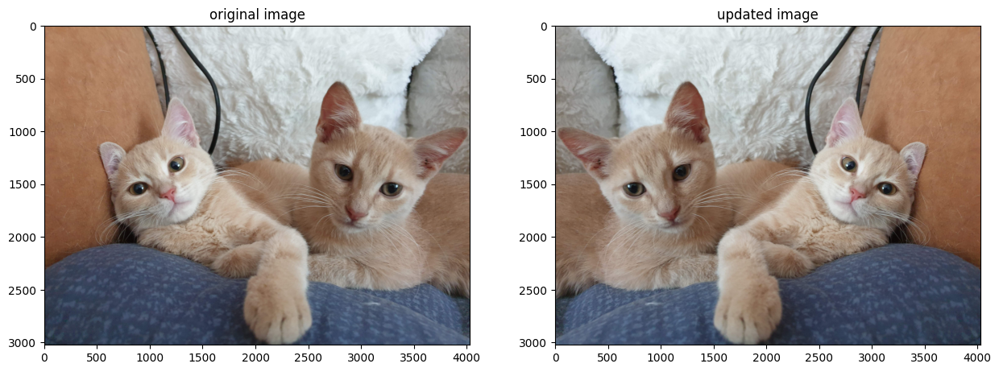

In [12]:
#horizontal_flip

updated_data = keras.preprocessing.image.ImageDataGenerator(horizontal_flip=True)
updated_array = updated_data.random_transform(cat_image_array)
updated_image = keras.preprocessing.image.array_to_img(updated_array)
plot_image(cat_image,updated_image)
plt.show()

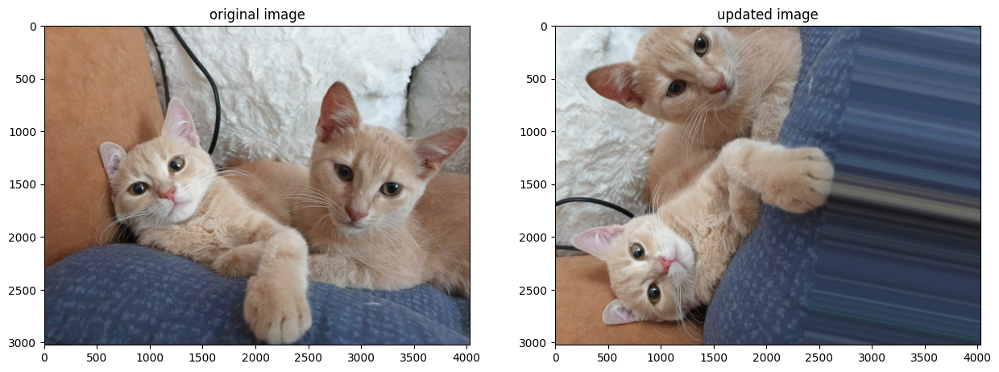

In [14]:
# Rotation

updated_data = keras.preprocessing.image.ImageDataGenerator(rotation_range =90)
updated_array = updated_data.random_transform(cat_image_array)
updated_image = keras.preprocessing.image.array_to_img(updated_array)
plot_image(cat_image,updated_image)
plt.show()


In [15]:
print(cat_image_array)
print("***************"*10)
print(updated_array)

[[[171. 115.  90.]
  [171. 115.  90.]
  [171. 115.  90.]
  ...
  [150. 147. 142.]
  [150. 147. 142.]
  [150. 147. 142.]]

 [[171. 115.  90.]
  [171. 115.  90.]
  [171. 115.  90.]
  ...
  [150. 147. 142.]
  [150. 147. 142.]
  [150. 147. 142.]]

 [[171. 115.  90.]
  [171. 115.  90.]
  [171. 115.  90.]
  ...
  [150. 147. 142.]
  [150. 147. 142.]
  [150. 147. 142.]]

 ...

 [[ 23.  58.  64.]
  [ 31.  66.  72.]
  [ 38.  71.  78.]
  ...
  [ 86. 106. 133.]
  [ 85. 102. 130.]
  [ 83. 100. 128.]]

 [[ 20.  57.  63.]
  [ 29.  64.  70.]
  [ 35.  68.  75.]
  ...
  [ 78.  98. 125.]
  [ 94. 111. 139.]
  [103. 120. 148.]]

 [[ 22.  59.  65.]
  [ 27.  64.  70.]
  [ 31.  64.  71.]
  ...
  [ 79.  99. 126.]
  [ 83. 100. 128.]
  [ 84. 101. 129.]]]
******************************************************************************************************************************************************
[[[220.       228.       231.      ]
  [220.62296  228.62296  231.62296 ]
  [221.       229.       232.      ]


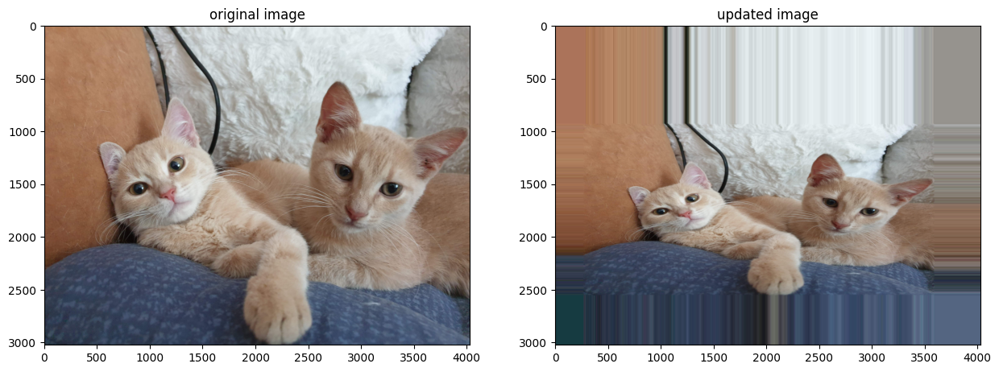

In [21]:
# zoom

updated_data = keras.preprocessing.image.ImageDataGenerator(zoom_range=[1.0,2.5])
updated_array = updated_data.random_transform(cat_image_array)
updated_image = keras.preprocessing.image.array_to_img(updated_array)
plot_image(cat_image,updated_image)
plt.show()


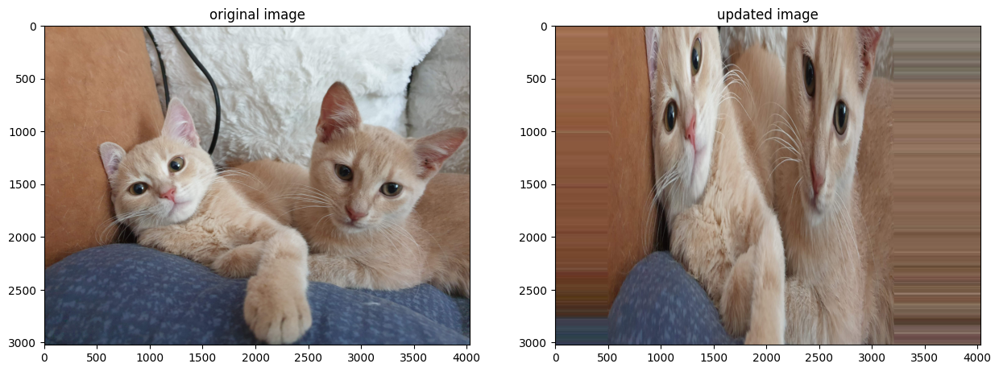

In [30]:
# zoom

updated_data = keras.preprocessing.image.ImageDataGenerator(zoom_range=[0.1,2.2])
updated_array = updated_data.random_transform(cat_image_array)
updated_image = keras.preprocessing.image.array_to_img(updated_array)
plot_image(cat_image,updated_image)
plt.show()


In [31]:
dataset = keras.preprocessing.image.ImageDataGenerator(
    rotation_range=45,
    width_shift_range=0.2,
    height_shift_range=0.3,
        shear_range=0.5,
    zoom_range=0.2,
        fill_mode='reflect',
        horizontal_flip=True,
        rescale=1.0/255,

)

In [34]:
cat_image_array_reshape = cat_image_array.reshape ((1,) + cat_image_array.shape)

print(cat_image_array.shape)
print(cat_image_array_reshape.shape)

# reshaped  to capture the 4 sides of the image

(3024, 4032, 3)
(1, 3024, 4032, 3)


In [36]:
directory ='/content/sample_data'
i =0

for j in dataset.flow(cat_image_array_reshape, save_to_dir =directory, save_prefix ='cat_image', save_format = 'jpg'):
  i +=1
  if i>25:
    break
